# Amazon Store Software Product Review Data

In [65]:
# Import Libraries (Other Libraries are Import When we used)
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
# Import Dataset
review = pd.read_json("C:\Local Disk (A);\Excelr\Assignment Excelr\\11 Text Mining\Software.json", encoding='windows-1252', lines=True)

# EDA

In [3]:
review

,overall,verified,reviewTime,reviewerID,asin,style,reviewerName,reviewText,summary,unixReviewTime,vote,image
0,4,True,"03 11, 2014",A240ORQ2LF9LUI,0077613252,{'Format:': ' Loose Leaf'},Michelle W,The materials arrived early and were in excell...,Material Great,1394496000,NaN,NaN
1,4,True,"02 23, 2014",A1YCCU0YRLS0FE,0077613252,{'Format:': ' Loose Leaf'},Rosalind White Ames,I am really enjoying this book with the worksh...,Health,1393113600,NaN,NaN
2,1,True,"02 17, 2014",A1BJHRQDYVAY2J,0077613252,{'Format:': ' Loose Leaf'},Allan R. Baker,"IF YOU ARE TAKING THIS CLASS DON""T WASTE YOUR ...",ARE YOU KIDING ME?,1392595200,7,NaN
3,3,True,"02 17, 2014",APRDVZ6QBIQXT,0077613252,{'Format:': ' Loose Leaf'},Lucy,This book was missing pages!!! Important pages...,missing pages!!,1392595200,3,NaN
4,5,False,"10 14, 2013",A2JZTTBSLS1QXV,0077775473,NaN,Albert V.,I have used LearnSmart and can officially say ...,Best study product out there!,1381708800,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
459431,2,True,"11 29, 2016",AGEWYJ2NF5C2H,B01HF41TKI,NaN,Bonita Alferes,No instructions.....No Help unless you want to...,Two Stars,1480377600,NaN,NaN
459432,1,True,"03 1, 2018",A3VCFV8WEQG9R5,B01HF3G4BS,NaN,mekonen,it's a joke,One Star,1519862400,NaN,NaN
459433,5,True,"12 2, 2017",A3DXGHJF6SOHNC,B01HF3G4BS,NaN,bbeckham,I have multiple licenses of the Antivirus. I h...,This is very effective antivirus software.,1512172800,NaN,NaN
459434,5,True,"09 15, 2018",A1WOS4D7QA06DO,B01HJAMWOK,NaN,Charles E. Potter,good value,Five Stars,1536969600,NaN,NaN


In [4]:
# Check Data
review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 459436 entries, 0 to 459435
Data columns (total 12 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   overall         459436 non-null  int64 
 1   verified        459436 non-null  bool  
 2   reviewTime      459436 non-null  object
 3   reviewerID      459436 non-null  object
 4   asin            459436 non-null  object
 5   style           234401 non-null  object
 6   reviewerName    459412 non-null  object
 7   reviewText      459370 non-null  object
 8   summary         459380 non-null  object
 9   unixReviewTime  459436 non-null  int64 
 10  vote            127853 non-null  object
 11  image           1508 non-null    object
dtypes: bool(1), int64(2), object(9)
memory usage: 39.0+ MB


In [5]:
review.describe()

,overall,unixReviewTime
count,459436.000000,4.594360e+05
mean,3.570175,1.369691e+09
std,1.626662,1.150168e+08
min,1.000000,9.127296e+08
25%,2.000000,1.322179e+09
50%,4.000000,1.405814e+09
75%,5.000000,1.448237e+09
max,5.000000,1.538438e+09


In [6]:
review.columns

Index(['overall', 'verified', 'reviewTime', 'reviewerID', 'asin', 'style',
       'reviewerName', 'reviewText', 'summary', 'unixReviewTime', 'vote',
       'image'],
      dtype='object')

In [7]:
review = review.drop(['overall', 'verified', 'reviewTime', 'reviewerID', 'asin', 'style',
       'reviewerName', 'summary', 'unixReviewTime', 'vote',
       'image'], axis=1)
review

,reviewText
0,The materials arrived early and were in excell...
1,I am really enjoying this book with the worksh...
2,"IF YOU ARE TAKING THIS CLASS DON""T WASTE YOUR ..."
3,This book was missing pages!!! Important pages...
4,I have used LearnSmart and can officially say ...
...,...
459431,No instructions.....No Help unless you want to...
459432,it's a joke
459433,I have multiple licenses of the Antivirus. I h...
459434,good value


In [8]:
# Review data is too big 459436 Rows of data, We are going for only 2001 Rows
#Text of length 4157942 exceeds maximum of 1000000. I will use 100000 rows but its maximum length then change to only 2000
review = review.iloc[:2000,:]
review

,reviewText
0,The materials arrived early and were in excell...
1,I am really enjoying this book with the worksh...
2,"IF YOU ARE TAKING THIS CLASS DON""T WASTE YOUR ..."
3,This book was missing pages!!! Important pages...
4,I have used LearnSmart and can officially say ...
...,...
1995,"I cannot even think of where I should start, f..."
1996,Hands down the best overall Linux experience y...
1997,Before I start...take those last 2 reviews wit...
1998,"Ok now it loads on my computer, it tells me to..."


In [9]:
# Check Null Values
review.isnull().sum()

reviewText    0
dtype: int64

In [10]:
review = review.rename({'reviewText':'Text'}, axis=1)

In [11]:
review

,Text
0,The materials arrived early and were in excell...
1,I am really enjoying this book with the worksh...
2,"IF YOU ARE TAKING THIS CLASS DON""T WASTE YOUR ..."
3,This book was missing pages!!! Important pages...
4,I have used LearnSmart and can officially say ...
...,...
1995,"I cannot even think of where I should start, f..."
1996,Hands down the best overall Linux experience y...
1997,Before I start...take those last 2 reviews wit...
1998,"Ok now it loads on my computer, it tells me to..."


# Text Processing

In [12]:
# Remove leading, trailing and empty string
review = [Text.strip() for Text in review.Text] # remove both the leading and the trailing characters
review = [Text for Text in review if Text] # removes empty strings, because they are considered in Python as False
review[0:10]

["The materials arrived early and were in excellent condition.  However for the money spent they really should've come with a binder and not just loose leaf.",
 'I am really enjoying this book with the worksheets that make you review your goals, what to do when you do not make it, it reminds me  of my human sexuality classwork.',
 'IF YOU ARE TAKING THIS CLASS DON"T WASTE YOUR MONEY ON THIS SO CALLED BOOK! $140.00 FOR A "BOOK" THAT ISIN\'T EVEN BOUND LOOSE LEAFS, THAT I HAD TO PROVIDE MY OWN BINDER FOR. TURNS OUT YOU CAN BUY ACCESS TO THE BOOK AT MCGRAW HILL CONNECT CORE FOR $70.00\n\nTHIS BOOK IS A COMPLETE WASTE OF MONEY!',
 "This book was missing pages!!! Important pages. I couldn't answer some test questions because of it!! I have never had this happen before.",
 'I have used LearnSmart and can officially say that this is an amazing study tool that quickly and simply adapts to your style of learning. You can access it at anytime and it is on the go! Once you start using LearnSmart 

In [13]:
# Joining the list into one string/text
cmt = ' '.join(review)
cmt

'The materials arrived early and were in excellent condition.  However for the money spent they really should\'ve come with a binder and not just loose leaf. I am really enjoying this book with the worksheets that make you review your goals, what to do when you do not make it, it reminds me  of my human sexuality classwork. IF YOU ARE TAKING THIS CLASS DON"T WASTE YOUR MONEY ON THIS SO CALLED BOOK! $140.00 FOR A "BOOK" THAT ISIN\'T EVEN BOUND LOOSE LEAFS, THAT I HAD TO PROVIDE MY OWN BINDER FOR. TURNS OUT YOU CAN BUY ACCESS TO THE BOOK AT MCGRAW HILL CONNECT CORE FOR $70.00\n\nTHIS BOOK IS A COMPLETE WASTE OF MONEY! This book was missing pages!!! Important pages. I couldn\'t answer some test questions because of it!! I have never had this happen before. I have used LearnSmart and can officially say that this is an amazing study tool that quickly and simply adapts to your style of learning. You can access it at anytime and it is on the go! Once you start using LearnSmart you will quickl

In [14]:
len(cmt)

888672

In [15]:
# remove Twitter username handles from a given twitter text. (Removes @usernames)
from nltk.tokenize import TweetTokenizer
tokenizer = TweetTokenizer(strip_handles=True)
rem_username = tokenizer.tokenize(cmt)
rem_username

['The',
 'materials',
 'arrived',
 'early',
 'and',
 'were',
 'in',
 'excellent',
 'condition',
 '.',
 'However',
 'for',
 'the',
 'money',
 'spent',
 'they',
 'really',
 "should've",
 'come',
 'with',
 'a',
 'binder',
 'and',
 'not',
 'just',
 'loose',
 'leaf',
 '.',
 'I',
 'am',
 'really',
 'enjoying',
 'this',
 'book',
 'with',
 'the',
 'worksheets',
 'that',
 'make',
 'you',
 'review',
 'your',
 'goals',
 ',',
 'what',
 'to',
 'do',
 'when',
 'you',
 'do',
 'not',
 'make',
 'it',
 ',',
 'it',
 'reminds',
 'me',
 'of',
 'my',
 'human',
 'sexuality',
 'classwork',
 '.',
 'IF',
 'YOU',
 'ARE',
 'TAKING',
 'THIS',
 'CLASS',
 'DON',
 '"',
 'T',
 'WASTE',
 'YOUR',
 'MONEY',
 'ON',
 'THIS',
 'SO',
 'CALLED',
 'BOOK',
 '!',
 '$',
 '140.00',
 'FOR',
 'A',
 '"',
 'BOOK',
 '"',
 'THAT',
 "ISIN'T",
 'EVEN',
 'BOUND',
 'LOOSE',
 'LEAFS',
 ',',
 'THAT',
 'I',
 'HAD',
 'TO',
 'PROVIDE',
 'MY',
 'OWN',
 'BINDER',
 'FOR',
 '.',
 'TURNS',
 'OUT',
 'YOU',
 'CAN',
 'BUY',
 'ACCESS',
 'TO',
 'THE',
 'B

In [16]:
# Again oining the list into one string/text
cmt_tokens = ' '.join(rem_username)
cmt_tokens

'The materials arrived early and were in excellent condition . However for the money spent they really should\'ve come with a binder and not just loose leaf . I am really enjoying this book with the worksheets that make you review your goals , what to do when you do not make it , it reminds me of my human sexuality classwork . IF YOU ARE TAKING THIS CLASS DON " T WASTE YOUR MONEY ON THIS SO CALLED BOOK ! $ 140.00 FOR A " BOOK " THAT ISIN\'T EVEN BOUND LOOSE LEAFS , THAT I HAD TO PROVIDE MY OWN BINDER FOR . TURNS OUT YOU CAN BUY ACCESS TO THE BOOK AT MCGRAW HILL CONNECT CORE FOR $ 70.00 THIS BOOK IS A COMPLETE WASTE OF MONEY ! This book was missing pages ! ! ! Important pages . I couldn\'t answer some test questions because of it ! ! I have never had this happen before . I have used LearnSmart and can officially say that this is an amazing study tool that quickly and simply adapts to your style of learning . You can access it at anytime and it is on the go ! Once you start using LearnSm

In [17]:
#Remove punctuation
import string
rem_punctuation = cmt_tokens.translate(str.maketrans('','',string.punctuation))
rem_punctuation

'The materials arrived early and were in excellent condition  However for the money spent they really shouldve come with a binder and not just loose leaf  I am really enjoying this book with the worksheets that make you review your goals  what to do when you do not make it  it reminds me of my human sexuality classwork  IF YOU ARE TAKING THIS CLASS DON  T WASTE YOUR MONEY ON THIS SO CALLED BOOK   14000 FOR A  BOOK  THAT ISINT EVEN BOUND LOOSE LEAFS  THAT I HAD TO PROVIDE MY OWN BINDER FOR  TURNS OUT YOU CAN BUY ACCESS TO THE BOOK AT MCGRAW HILL CONNECT CORE FOR  7000 THIS BOOK IS A COMPLETE WASTE OF MONEY  This book was missing pages    Important pages  I couldnt answer some test questions because of it   I have never had this happen before  I have used LearnSmart and can officially say that this is an amazing study tool that quickly and simply adapts to your style of learning  You can access it at anytime and it is on the go  Once you start using LearnSmart you will quickly realize th

In [18]:
# Remove online portals name like https, url
import re
rem_url = re.sub(r'http\S+','',rem_punctuation) 
rem_url

'The materials arrived early and were in excellent condition  However for the money spent they really shouldve come with a binder and not just loose leaf  I am really enjoying this book with the worksheets that make you review your goals  what to do when you do not make it  it reminds me of my human sexuality classwork  IF YOU ARE TAKING THIS CLASS DON  T WASTE YOUR MONEY ON THIS SO CALLED BOOK   14000 FOR A  BOOK  THAT ISINT EVEN BOUND LOOSE LEAFS  THAT I HAD TO PROVIDE MY OWN BINDER FOR  TURNS OUT YOU CAN BUY ACCESS TO THE BOOK AT MCGRAW HILL CONNECT CORE FOR  7000 THIS BOOK IS A COMPLETE WASTE OF MONEY  This book was missing pages    Important pages  I couldnt answer some test questions because of it   I have never had this happen before  I have used LearnSmart and can officially say that this is an amazing study tool that quickly and simply adapts to your style of learning  You can access it at anytime and it is on the go  Once you start using LearnSmart you will quickly realize th

In [19]:
# Tokenization
from nltk.tokenize import word_tokenize
cmt_word = word_tokenize(rem_url)
cmt_word

['The',
 'materials',
 'arrived',
 'early',
 'and',
 'were',
 'in',
 'excellent',
 'condition',
 'However',
 'for',
 'the',
 'money',
 'spent',
 'they',
 'really',
 'shouldve',
 'come',
 'with',
 'a',
 'binder',
 'and',
 'not',
 'just',
 'loose',
 'leaf',
 'I',
 'am',
 'really',
 'enjoying',
 'this',
 'book',
 'with',
 'the',
 'worksheets',
 'that',
 'make',
 'you',
 'review',
 'your',
 'goals',
 'what',
 'to',
 'do',
 'when',
 'you',
 'do',
 'not',
 'make',
 'it',
 'it',
 'reminds',
 'me',
 'of',
 'my',
 'human',
 'sexuality',
 'classwork',
 'IF',
 'YOU',
 'ARE',
 'TAKING',
 'THIS',
 'CLASS',
 'DON',
 'T',
 'WASTE',
 'YOUR',
 'MONEY',
 'ON',
 'THIS',
 'SO',
 'CALLED',
 'BOOK',
 '14000',
 'FOR',
 'A',
 'BOOK',
 'THAT',
 'ISINT',
 'EVEN',
 'BOUND',
 'LOOSE',
 'LEAFS',
 'THAT',
 'I',
 'HAD',
 'TO',
 'PROVIDE',
 'MY',
 'OWN',
 'BINDER',
 'FOR',
 'TURNS',
 'OUT',
 'YOU',
 'CAN',
 'BUY',
 'ACCESS',
 'TO',
 'THE',
 'BOOK',
 'AT',
 'MCGRAW',
 'HILL',
 'CONNECT',
 'CORE',
 'FOR',
 '7000',
 'TH

In [20]:
len(cmt_word)

159462

In [21]:
# Remove Stopwords
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_word_list = ['\x92','rt','ye','yeah','haha','Yes','U0001F923','I','https']
stop_words.extend(stop_word_list)

stop_tokens = [word for word in cmt_word if not word in stop_words]
stop_tokens

['The',
 'materials',
 'arrived',
 'early',
 'excellent',
 'condition',
 'However',
 'money',
 'spent',
 'really',
 'shouldve',
 'come',
 'binder',
 'loose',
 'leaf',
 'really',
 'enjoying',
 'book',
 'worksheets',
 'make',
 'review',
 'goals',
 'make',
 'reminds',
 'human',
 'sexuality',
 'classwork',
 'IF',
 'YOU',
 'ARE',
 'TAKING',
 'THIS',
 'CLASS',
 'DON',
 'T',
 'WASTE',
 'YOUR',
 'MONEY',
 'ON',
 'THIS',
 'SO',
 'CALLED',
 'BOOK',
 '14000',
 'FOR',
 'A',
 'BOOK',
 'THAT',
 'ISINT',
 'EVEN',
 'BOUND',
 'LOOSE',
 'LEAFS',
 'THAT',
 'HAD',
 'TO',
 'PROVIDE',
 'MY',
 'OWN',
 'BINDER',
 'FOR',
 'TURNS',
 'OUT',
 'YOU',
 'CAN',
 'BUY',
 'ACCESS',
 'TO',
 'THE',
 'BOOK',
 'AT',
 'MCGRAW',
 'HILL',
 'CONNECT',
 'CORE',
 'FOR',
 '7000',
 'THIS',
 'BOOK',
 'IS',
 'A',
 'COMPLETE',
 'WASTE',
 'OF',
 'MONEY',
 'This',
 'book',
 'missing',
 'pages',
 'Important',
 'pages',
 'couldnt',
 'answer',
 'test',
 'questions',
 'never',
 'happen',
 'used',
 'LearnSmart',
 'officially',
 'say',
 'ama

In [22]:
len(stop_tokens)

87345

In [23]:
# Normalize the data (UpperCase Letter Convert to LowerCase)
lower_case = [Text.lower() for Text in stop_tokens]
lower_case

['the',
 'materials',
 'arrived',
 'early',
 'excellent',
 'condition',
 'however',
 'money',
 'spent',
 'really',
 'shouldve',
 'come',
 'binder',
 'loose',
 'leaf',
 'really',
 'enjoying',
 'book',
 'worksheets',
 'make',
 'review',
 'goals',
 'make',
 'reminds',
 'human',
 'sexuality',
 'classwork',
 'if',
 'you',
 'are',
 'taking',
 'this',
 'class',
 'don',
 't',
 'waste',
 'your',
 'money',
 'on',
 'this',
 'so',
 'called',
 'book',
 '14000',
 'for',
 'a',
 'book',
 'that',
 'isint',
 'even',
 'bound',
 'loose',
 'leafs',
 'that',
 'had',
 'to',
 'provide',
 'my',
 'own',
 'binder',
 'for',
 'turns',
 'out',
 'you',
 'can',
 'buy',
 'access',
 'to',
 'the',
 'book',
 'at',
 'mcgraw',
 'hill',
 'connect',
 'core',
 'for',
 '7000',
 'this',
 'book',
 'is',
 'a',
 'complete',
 'waste',
 'of',
 'money',
 'this',
 'book',
 'missing',
 'pages',
 'important',
 'pages',
 'couldnt',
 'answer',
 'test',
 'questions',
 'never',
 'happen',
 'used',
 'learnsmart',
 'officially',
 'say',
 'ama

In [24]:
len(lower_case)

87345

In [25]:
# Stemming
from nltk.stem import PorterStemmer
ps = PorterStemmer()
stem_tokens = [ps.stem(word) for word in lower_case]
stem_tokens

['the',
 'materi',
 'arriv',
 'earli',
 'excel',
 'condit',
 'howev',
 'money',
 'spent',
 'realli',
 'shouldv',
 'come',
 'binder',
 'loos',
 'leaf',
 'realli',
 'enjoy',
 'book',
 'worksheet',
 'make',
 'review',
 'goal',
 'make',
 'remind',
 'human',
 'sexual',
 'classwork',
 'if',
 'you',
 'are',
 'take',
 'thi',
 'class',
 'don',
 't',
 'wast',
 'your',
 'money',
 'on',
 'thi',
 'so',
 'call',
 'book',
 '14000',
 'for',
 'a',
 'book',
 'that',
 'isint',
 'even',
 'bound',
 'loos',
 'leaf',
 'that',
 'had',
 'to',
 'provid',
 'my',
 'own',
 'binder',
 'for',
 'turn',
 'out',
 'you',
 'can',
 'buy',
 'access',
 'to',
 'the',
 'book',
 'at',
 'mcgraw',
 'hill',
 'connect',
 'core',
 'for',
 '7000',
 'thi',
 'book',
 'is',
 'a',
 'complet',
 'wast',
 'of',
 'money',
 'thi',
 'book',
 'miss',
 'page',
 'import',
 'page',
 'couldnt',
 'answer',
 'test',
 'question',
 'never',
 'happen',
 'use',
 'learnsmart',
 'offici',
 'say',
 'amaz',
 'studi',
 'tool',
 'quickli',
 'simpli',
 'adapt'

In [26]:
len(stem_tokens)

87345

In [27]:
# NLP english language model of spacy library
import spacy

In [28]:
# Lemmatization
nlp = spacy.load('en_core_web_sm')
doc = nlp(' '.join(lower_case))
print(doc)

the materials arrived early excellent condition however money spent really shouldve come binder loose leaf really enjoying book worksheets make review goals make reminds human sexuality classwork if you are taking this class don t waste your money on this so called book 14000 for a book that isint even bound loose leafs that had to provide my own binder for turns out you can buy access to the book at mcgraw hill connect core for 7000 this book is a complete waste of money this book missing pages important pages couldnt answer test questions never happen used learnsmart officially say amazing study tool quickly simply adapts style learning you access anytime go once start using learnsmart quickly realize best way learn study business student use learnsmart accounting class however use accounting ii class the grade difference accounting accounting ii whole letter grade thanks learnsmart every college student definitely check strong backgroung good read quite date it takes holistic approa

In [29]:
lemmas = [token.lemma_ for token in doc]
lemmas

['the',
 'material',
 'arrive',
 'early',
 'excellent',
 'condition',
 'however',
 'money',
 'spend',
 'really',
 'should',
 've',
 'come',
 'binder',
 'loose',
 'leaf',
 'really',
 'enjoy',
 'book',
 'worksheet',
 'make',
 'review',
 'goal',
 'make',
 'remind',
 'human',
 'sexuality',
 'classwork',
 'if',
 'you',
 'be',
 'take',
 'this',
 'class',
 'don',
 't',
 'waste',
 'your',
 'money',
 'on',
 'this',
 'so',
 'call',
 'book',
 '14000',
 'for',
 'a',
 'book',
 'that',
 'isint',
 'even',
 'bind',
 'loose',
 'leafs',
 'that',
 'have',
 'to',
 'provide',
 'my',
 'own',
 'binder',
 'for',
 'turn',
 'out',
 'you',
 'can',
 'buy',
 'access',
 'to',
 'the',
 'book',
 'at',
 'mcgraw',
 'hill',
 'connect',
 'core',
 'for',
 '7000',
 'this',
 'book',
 'be',
 'a',
 'complete',
 'waste',
 'of',
 'money',
 'this',
 'book',
 'miss',
 'page',
 'important',
 'page',
 'could',
 'not',
 'answer',
 'test',
 'question',
 'never',
 'happen',
 'use',
 'learnsmart',
 'officially',
 'say',
 'amazing',
 's

In [30]:
# Our Text Data was All clean
clean_text = ' '.join(lemmas)
clean_text

'the material arrive early excellent condition however money spend really should ve come binder loose leaf really enjoy book worksheet make review goal make remind human sexuality classwork if you be take this class don t waste your money on this so call book 14000 for a book that isint even bind loose leafs that have to provide my own binder for turn out you can buy access to the book at mcgraw hill connect core for 7000 this book be a complete waste of money this book miss page important page could not answer test question never happen use learnsmart officially say amazing study tool quickly simply adapt style learn you access anytime go once start use learnsmart quickly realize good way learn study business student use learnsmart accounting class however use accounting ii class the grade difference accounting accounting ii whole letter grade thank learnsmart every college student definitely check strong backgroung good read quite date it take holistic approach subject lack reference

# Feature Extraction

In [31]:
# Feature Extraction using count vectorizer
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()
cv_fe = cv.fit_transform(lemmas)
cv_fe

<89024x6887 sparse matrix of type '<class 'numpy.int64'>'
	with 87077 stored elements in Compressed Sparse Row format>

In [32]:
print(cv.vocabulary_)

{'the': 6099, 'material': 3796, 'arrive': 646, 'early': 2006, 'excellent': 2244, 'condition': 1400, 'however': 2997, 'money': 3963, 'spend': 5723, 'really': 4969, 'should': 5525, 've': 6545, 'come': 1311, 'binder': 877, 'loose': 3661, 'leaf': 3502, 'enjoy': 2131, 'book': 928, 'worksheet': 6802, 'make': 3737, 'review': 5218, 'goal': 2702, 'remind': 5103, 'human': 3009, 'sexuality': 5479, 'classwork': 1237, 'if': 3047, 'you': 6866, 'be': 810, 'take': 6009, 'this': 6135, 'class': 1230, 'don': 1913, 'waste': 6651, 'your': 6868, 'on': 4297, 'so': 5649, 'call': 1063, '14000': 57, 'for': 2497, 'that': 6096, 'isint': 3327, 'even': 2209, 'bind': 876, 'leafs': 3503, 'have': 2841, 'to': 6213, 'provide': 4848, 'my': 4039, 'own': 4416, 'turn': 6320, 'out': 4368, 'can': 1075, 'buy': 1041, 'access': 338, 'at': 691, 'mcgraw': 3815, 'hill': 2925, 'connect': 1425, 'core': 1503, '7000': 266, 'complete': 1360, 'of': 4269, 'miss': 3934, 'page': 4431, 'important': 3091, 'could': 1521, 'not': 4198, 'answer':

In [33]:
print(cv.get_feature_names())

['000', '0000', '005', '007', '01', '01575', '03216700', '03217018', '03217198', '07897444', '08', '08248316', '09', '09554599', '09826978', '0ld', '0r', '0x80000008', '10', '100', '1000', '10000', '100000', '100000x', '101', '1010', '1023', '104', '105', '106', '10641', '108', '109', '10hour', '10k', '10px', '11', '110', '112', '1126', '113', '115', '116', '11979', '12', '120', '12010', '12068', '124', '126', '13', '1300', '1304', '133', '13th', '14', '1400', '14000', '14133071', '14133127', '14133137', '14133163', '14262963', '1495', '14999', '15', '150', '15000', '16', '165', '16900', '17', '17000', '17th', '18', '1800', '1810', '1880', '1888', '18882008', '18882010', '188889', '1890', '1899', '19', '1900', '1913', '1915', '1916', '1918', '1920', '1920x1200', '1923', '1925', '1926', '1927', '1930', '1942', '1946', '1950', '1953', '196', '1960', '1960s', '1961', '1970', '1977', '1979', '1980', '1981', '1984', '1987', '1988', '1990', '1991', '1992', '1993', '1995', '1996', '1998', '19

C:\Users\aksha\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [34]:
print(cv_fe.toarray())

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [35]:
print(cv_fe.toarray().shape)

(89024, 6887)


# Let's see how can bigrams and trigrams can be included here

In [36]:
# count vectorizer with  n-gram (bi-gram & trigram)
cv_ngram = CountVectorizer(analyzer='word',ngram_range=(1,3),max_features=100)
bow_matrix_ngram=cv_ngram.fit_transform(lemmas)

In [37]:
print(cv_ngram.get_feature_names())
print(bow_matrix_ngram.toarray())

['365', 'able', 'also', 'back', 'be', 'bible', 'book', 'buy', 'come', 'computer', 'could', 'do', 'document', 'download', 'dvd', 'easy', 'even', 'every', 'feature', 'find', 'first', 'get', 'give', 'go', 'good', 'great', 'hard', 'help', 'home', 'if', 'include', 'information', 'instal', 'install', 'issue', 'it', 'its', 'japanese', 'key', 'know', 'learn', 'like', 'look', 'lot', 'love', 'mac', 'make', 'many', 'microsoft', 'much', 'need', 'new', 'not', 'note', 'office', 'old', 'one', 'page', 'pc', 'price', 'problem', 'product', 'program', 'purchase', 'read', 'really', 'recommend', 'review', 'say', 'see', 'so', 'software', 'start', 'still', 'study', 'subscription', 'support', 'take', 'the', 'there', 'thing', 'think', 'this', 'time', 'try', 'update', 'use', 'user', 've', 'version', 'video', 'want', 'way', 'well', 'window', 'word', 'work', 'would', 'year', 'you']
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


# Word Cloud

In [38]:
# Create a WordCloud
from wordcloud import WordCloud, STOPWORDS
def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')

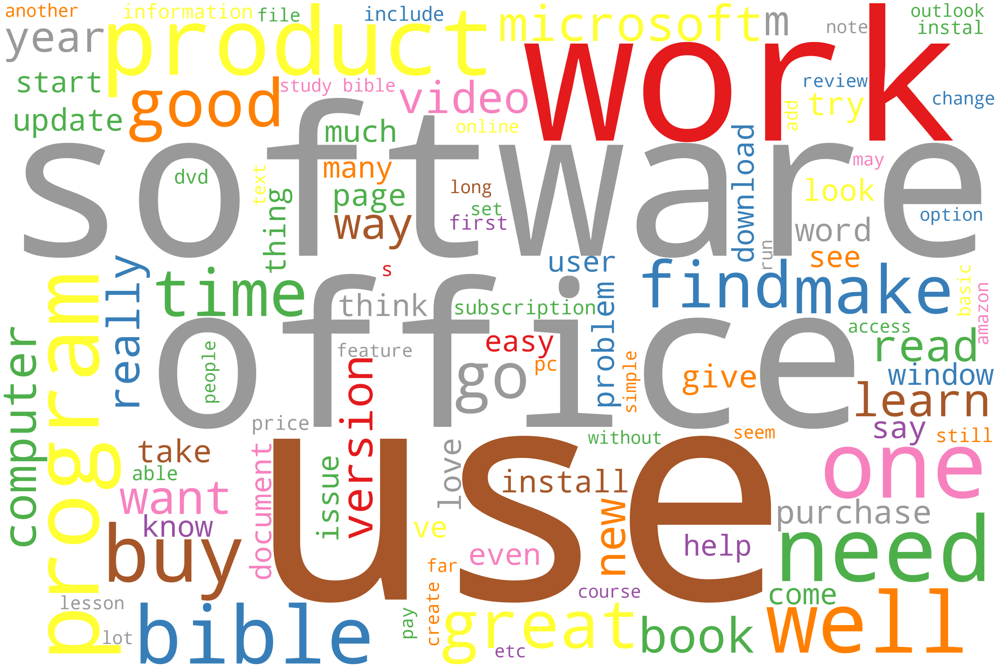

In [39]:
stopwords = STOPWORDS
stopwords.add('pron')
stopwords.add('rt')
stopwords.add('yeah')
wordcloud = WordCloud(width = 3000, height = 2000, background_color='white', max_words=100,colormap='Set1',stopwords=stopwords)
wordcloud.generate(clean_text)
# Plot
plot_cloud(wordcloud)

# Named Entity Recognition

In [40]:
import spacy
nlp = spacy.load('en_core_web_sm')

#Parts of Speech (POS) Tagging

blocks = clean_text
text_blocks = nlp(blocks)
spacy.displacy.render(text_blocks, style='ent' , jupyter=True)

In [41]:
for token in text_blocks:
    print(token, token.pos_)

the DET
material NOUN
arrive VERB
early ADJ
excellent ADJ
condition NOUN
however ADV
money NOUN
spend VERB
really ADV
should AUX
ve AUX
come VERB
binder ADJ
loose ADJ
leaf NOUN
really ADV
enjoy VERB
book NOUN
worksheet NOUN
make VERB
review NOUN
goal NOUN
make VERB
remind VERB
human ADJ
sexuality NOUN
classwork NOUN
if SCONJ
you PRON
be VERB
take VERB
this DET
class NOUN
don PROPN
t PROPN
waste VERB
your PRON
money NOUN
on ADP
this DET
so ADV
call NOUN
book NOUN
14000 NUM
for SCONJ
a DET
book NOUN
that PRON
isint VERB
even ADV
bind VERB
loose ADJ
leafs NOUN
that PRON
have VERB
to PART
provide VERB
my PRON
own ADJ
binder NOUN
for ADP
turn NOUN
out ADP
you PRON
can AUX
buy VERB
access NOUN
to ADP
the DET
book NOUN
at ADP
mcgraw PROPN
hill PROPN
connect NOUN
core NOUN
for ADP
7000 NUM
this DET
book NOUN
be AUX
a DET
complete ADJ
waste NOUN
of ADP
money NOUN
this DET
book NOUN
miss PROPN
page NOUN
important ADJ
page NOUN
could AUX
not PART
answer VERB
test NOUN
question NOUN
never ADV
happ

probably ADV
one NUM
overlook VERB
underrated ADJ
component NOUN
office NOUN
suite NOUN
first ADV
encounter PROPN
office PROPN
2007 NUM
become VERB
handy ADJ
way NOUN
keep VERB
simple ADJ
note NOUN
limit VERB
the DET
new ADJ
version NOUN
allow VERB
embed PROPN
excel PROPN
spreadsheet PROPN
see VERB
preview NOUN
within ADP
note NOUN
when SCONJ
update VERB
spreadsheet NOUN
preview NOUN
automatically ADV
update VERB
well ADJ
search NOUN
within ADP
onenote ADJ
well ADJ
search NOUN
word NOUN
embed VERB
graphic ADJ
file NOUN
powerpoint NOUN
there PRON
s VERB
new ADJ
clean ADJ
look NOUN
powerpoint ADJ
you PRON
start VERB
new ADJ
presentation NOUN
use VERB
theme NOUN
template NOUN
old ADJ
presentation NOUN
recent ADJ
one NUM
well INTJ
blank ADJ
one NUM
new ADJ
user NOUN
find VERB
powerpoint NOUN
2013 NUM
intuitive ADJ
old ADJ
version NOUN
experience NOUN
powerpoint NOUN
pro ADJ
find VERB
everything PRON
seem VERB
go VERB
smoother ADJ
pull VERB
old ADJ
presentation NOUN
include VERB
one NUM
lat

motherinlaw PROPN
read VERB
ng PROPN
since SCONJ
childhood NOUN
she PRON
tickle VERB
pink ADV
think VERB
able ADJ
read NOUN
see VERB
picture NOUN
etc X
childhood NOUN
she PRON
quite ADV
computer NOUN
savvy ADJ
however ADV
get VERB
dvd NOUN
load NOUN
despite SCONJ
attempt NOUN
mine PRON
follow VERB
complicated ADJ
convoluted ADJ
instruction NOUN
ng PROPN
website NOUN
regard VERB
many ADJ
issue NOUN
flawed ADJ
installation NOUN
program NOUN
place NOUN
dvd NOUN
collection NOUN
email NOUN
ng PROPN
customer NOUN
service NOUN
3 NUM
time NOUN
take VERB
week NOUN
respond NOUN
simply ADV
wish VERB
know PROPN
send VERB
mil PROPN
disc PROPN
new ADJ
installation NOUN
program NOUN
otherwise ADV
well ADV
force VERB
return NOUN
product NOUN
amazon PROPN
wait PROPN
time NOUN
come VERB
new ADJ
edition NOUN
be AUX
not PART
flawed ADJ
edit NOUN
ng PROPN
working PROPN
mil PROPN
try VERB
get VERB
thing NOUN
run VERB
update NOUN
work NOUN
update NOUN
mil NOUN
get VERB
work NOUN
help NOUN
ng PROPN
people NOU

In [42]:
# Filtering the nouns and verbs only
noun_verbs = [token.text for token in text_blocks if token.pos_ in ('NOUN', "VERB")]
noun_verbs

['material',
 'arrive',
 'condition',
 'money',
 'spend',
 'come',
 'leaf',
 'enjoy',
 'book',
 'worksheet',
 'make',
 'review',
 'goal',
 'make',
 'remind',
 'sexuality',
 'classwork',
 'be',
 'take',
 'class',
 'waste',
 'money',
 'call',
 'book',
 'book',
 'isint',
 'bind',
 'leafs',
 'have',
 'provide',
 'binder',
 'turn',
 'buy',
 'access',
 'book',
 'connect',
 'core',
 'book',
 'waste',
 'money',
 'book',
 'page',
 'page',
 'answer',
 'test',
 'question',
 'happen',
 'use',
 'learnsmart',
 'say',
 'study',
 'tool',
 'adapt',
 'style',
 'learn',
 'access',
 'go',
 'start',
 'use',
 'learnsmart',
 'realize',
 'way',
 'learn',
 'study',
 'business',
 'student',
 'use',
 'learnsmart',
 'accounting',
 'class',
 'use',
 'accounting',
 'class',
 'grade',
 'difference',
 'accounting',
 'accounting',
 'letter',
 'grade',
 'thank',
 'learnsmart',
 'college',
 'student',
 'check',
 'good',
 'read',
 'date',
 'take',
 'approach',
 'subject',
 'lack',
 'reference',
 'bite',
 'jorge',
 'hear'

In [43]:
# Count the noun & verbs tokens
CV = CountVectorizer()
X = CV.fit_transform(noun_verbs)
X

<49144x4079 sparse matrix of type '<class 'numpy.int64'>'
	with 48819 stored elements in Compressed Sparse Row format>

In [44]:
# Same word Addition
sum_word = X.sum(axis=0)
sum_word

matrix([[ 1,  1,  1, ..., 15,  1,  2]], dtype=int64)

In [45]:
word_freq = [(word, sum_word[0, idx]) for word, idx in CV.vocabulary_.items()]
word_freq

[('material', 62),
 ('arrive', 34),
 ('condition', 17),
 ('money', 109),
 ('spend', 70),
 ('come', 174),
 ('leaf', 1),
 ('enjoy', 57),
 ('book', 298),
 ('worksheet', 4),
 ('make', 409),
 ('review', 156),
 ('goal', 5),
 ('remind', 5),
 ('sexuality', 1),
 ('classwork', 1),
 ('be', 22),
 ('take', 249),
 ('class', 84),
 ('waste', 36),
 ('call', 83),
 ('isint', 1),
 ('bind', 7),
 ('leafs', 1),
 ('have', 43),
 ('provide', 94),
 ('binder', 1),
 ('turn', 54),
 ('buy', 356),
 ('access', 142),
 ('connect', 19),
 ('core', 9),
 ('page', 228),
 ('answer', 45),
 ('test', 42),
 ('question', 61),
 ('happen', 31),
 ('use', 1117),
 ('learnsmart', 4),
 ('say', 210),
 ('study', 248),
 ('tool', 88),
 ('adapt', 4),
 ('style', 33),
 ('learn', 405),
 ('go', 378),
 ('start', 187),
 ('realize', 24),
 ('way', 277),
 ('business', 110),
 ('student', 54),
 ('accounting', 7),
 ('grade', 4),
 ('difference', 28),
 ('letter', 16),
 ('thank', 47),
 ('college', 24),
 ('check', 40),
 ('good', 9),
 ('read', 282),
 ('date',

In [46]:
word_freq = sorted(word_freq, key=lambda X:X[1], reverse=True)
word_freq

[('use', 1117),
 ('office', 844),
 ('product', 669),
 ('work', 635),
 ('get', 610),
 ('software', 561),
 ('version', 467),
 ('program', 463),
 ('time', 449),
 ('need', 411),
 ('year', 411),
 ('make', 409),
 ('learn', 405),
 ('go', 378),
 ('buy', 356),
 ('computer', 343),
 ('find', 331),
 ('word', 320),
 ('want', 312),
 ('book', 298),
 ('video', 288),
 ('subscription', 286),
 ('read', 282),
 ('way', 277),
 ('price', 252),
 ('take', 249),
 ('study', 248),
 ('install', 247),
 ('give', 233),
 ('purchase', 231),
 ('page', 228),
 ('thing', 215),
 ('recommend', 215),
 ('user', 214),
 ('say', 210),
 ('try', 210),
 ('look', 208),
 ('love', 206),
 ('update', 206),
 ('document', 202),
 ('issue', 198),
 ('problem', 195),
 ('pc', 193),
 ('think', 193),
 ('know', 188),
 ('start', 187),
 ('window', 181),
 ('see', 175),
 ('come', 174),
 ('information', 173),
 ('download', 170),
 ('help', 168),
 ('feature', 159),
 ('include', 157),
 ('review', 156),
 ('note', 154),
 ('support', 153),
 ('lot', 149),
 ('

In [47]:
trend_word = pd.DataFrame(word_freq)
trend_word.columns = ['Word','Count']
trend_word.head(10)

,Word,Count
0,use,1117
1,office,844
2,product,669
3,work,635
4,get,610
5,software,561
6,version,467
7,program,463
8,time,449
9,need,411


<AxesSubplot:xlabel='Word'>

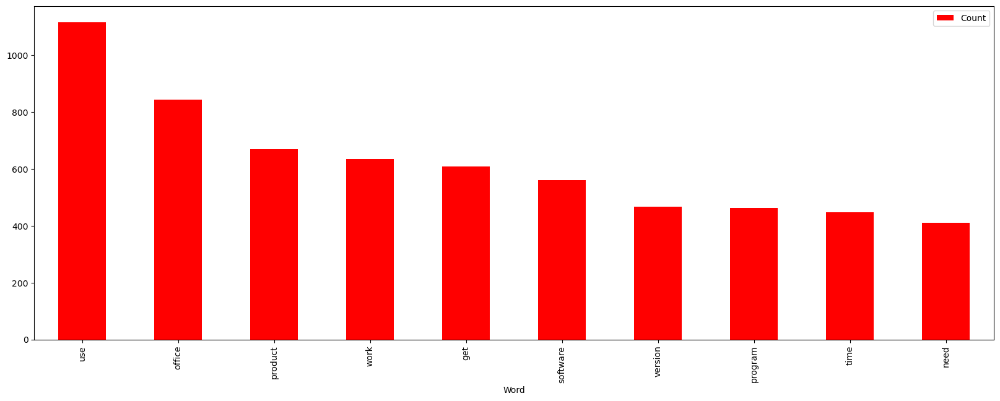

In [48]:
# Top ten Used Word
trend_word[0:10].plot.bar(x='Word',y='Count', figsize=(20,7), color = 'red')

# Emotion Mining 

In [49]:
from nltk import tokenize
sentence = tokenize.sent_tokenize(''.join(cmt))
sentence

['The materials arrived early and were in excellent condition.',
 "However for the money spent they really should've come with a binder and not just loose leaf.",
 'I am really enjoying this book with the worksheets that make you review your goals, what to do when you do not make it, it reminds me  of my human sexuality classwork.',
 'IF YOU ARE TAKING THIS CLASS DON"T WASTE YOUR MONEY ON THIS SO CALLED BOOK!',
 '$140.00 FOR A "BOOK" THAT ISIN\'T EVEN BOUND LOOSE LEAFS, THAT I HAD TO PROVIDE MY OWN BINDER FOR.',
 'TURNS OUT YOU CAN BUY ACCESS TO THE BOOK AT MCGRAW HILL CONNECT CORE FOR $70.00\n\nTHIS BOOK IS A COMPLETE WASTE OF MONEY!',
 'This book was missing pages!!!',
 'Important pages.',
 "I couldn't answer some test questions because of it!!",
 'I have never had this happen before.',
 'I have used LearnSmart and can officially say that this is an amazing study tool that quickly and simply adapts to your style of learning.',
 'You can access it at anytime and it is on the go!',
 'O

In [50]:
sentence_df = pd.DataFrame(sentence, columns=['Sentence'])
sentence_df

,Sentence
0,The materials arrived early and were in excell...
1,However for the money spent they really should...
2,I am really enjoying this book with the worksh...
3,"IF YOU ARE TAKING THIS CLASS DON""T WASTE YOUR ..."
4,"$140.00 FOR A ""BOOK"" THAT ISIN'T EVEN BOUND LO..."
...,...
9608,Nothing but problems and now I have to take my...
9609,"It said this was a easy install, well my compu..."
9610,During the install the screen became\n\nall li...
9611,Then it would come up with\n\nsome text that w...


In [51]:
# Add Afinn Csv for Emotion Lexicon
afinn = pd.read_csv("C:\Local Disk (A);\Excelr\Assignment Excelr\\11 Text Mining\Afinn.csv", sep=',', encoding='Latin-1')
afinn

,word,value
0,abandon,-2
1,abandoned,-2
2,abandons,-2
3,abducted,-2
4,abduction,-2
...,...,...
2472,yucky,-2
2473,yummy,3
2474,zealot,-2
2475,zealots,-2


In [52]:
affinity_score = afinn.set_index('word')['value'].to_dict()
affinity_score

{'abandon': -2,
 'abandoned': -2,
 'abandons': -2,
 'abducted': -2,
 'abduction': -2,
 'abductions': -2,
 'abhor': -3,
 'abhorred': -3,
 'abhorrent': -3,
 'abhors': -3,
 'abilities': 2,
 'ability': 2,
 'aboard': 1,
 'absentee': -1,
 'absentees': -1,
 'absolve': 2,
 'absolved': 2,
 'absolves': 2,
 'absolving': 2,
 'absorbed': 1,
 'abuse': -3,
 'abused': -3,
 'abuses': -3,
 'abusive': -3,
 'accept': 1,
 'accepted': 1,
 'accepting': 1,
 'accepts': 1,
 'accident': -2,
 'accidental': -2,
 'accidentally': -2,
 'accidents': -2,
 'accomplish': 2,
 'accomplished': 2,
 'accomplishes': 2,
 'accusation': -2,
 'accusations': -2,
 'accuse': -2,
 'accused': -2,
 'accuses': -2,
 'accusing': -2,
 'ache': -2,
 'achievable': 1,
 'aching': -2,
 'acquit': 2,
 'acquits': 2,
 'acquitted': 2,
 'acquitting': 2,
 'acrimonious': -3,
 'active': 1,
 'adequate': 1,
 'admire': 3,
 'admired': 3,
 'admires': 3,
 'admiring': 3,
 'admit': -1,
 'admits': -1,
 'admitted': -1,
 'admonish': -2,
 'admonished': -2,
 'adopt': 

In [53]:
nlp = spacy.load('en_core_web_sm')

sentiment_lexicon = affinity_score
# Custom function: score each word in a sentence in lemmatised form, but calculate the score for the whole original sentence
def calculate_sentiment(text:str=None):
    sent_score = 0
    if text:
        sentence = nlp(text)
        for word in sentence:
            sent_score += sentiment_lexicon.get(word.lemma_,0)
    return sent_score

In [54]:
calculate_sentiment(text= 'accidents')

-2

In [56]:
# Calculating sentiment value for each sentence

sentence_df['Sentiment_value'] = sentence_df['Sentence'].apply(calculate_sentiment)
sentence_df

,Sentence,Sentiment_value
0,The materials arrived early and were in excell...,3
1,However for the money spent they really should...,-3
2,I am really enjoying this book with the worksh...,2
3,"IF YOU ARE TAKING THIS CLASS DON""T WASTE YOUR ...",0
4,"$140.00 FOR A ""BOOK"" THAT ISIN'T EVEN BOUND LO...",0
...,...,...
9608,Nothing but problems and now I have to take my...,-2
9609,"It said this was a easy install, well my compu...",1
9610,During the install the screen became\n\nall li...,-2
9611,Then it would come up with\n\nsome text that w...,0


In [57]:
# how many words are there in a sentence
sentence_df['word_count'] = sentence_df['Sentence'].str.split().apply(len)
sentence_df

,Sentence,Sentiment_value,word_count
0,The materials arrived early and were in excell...,3,9
1,However for the money spent they really should...,-3,17
2,I am really enjoying this book with the worksh...,2,32
3,"IF YOU ARE TAKING THIS CLASS DON""T WASTE YOUR ...",0,15
4,"$140.00 FOR A ""BOOK"" THAT ISIN'T EVEN BOUND LO...",0,19
...,...,...,...
9608,Nothing but problems and now I have to take my...,-2,16
9609,"It said this was a easy install, well my compu...",1,17
9610,During the install the screen became\n\nall li...,-2,38
9611,Then it would come up with\n\nsome text that w...,0,21


In [58]:
# Sort a Ascending order of Sentiment Value
sentence_df.sort_values(by= 'Sentiment_value')

,Sentence,Sentiment_value,word_count
3022,A few hours later I received an e-mail with a ...,-9,51
5637,The lack of color makes their product boring a...,-9,23
5774,I BOUGHT THIS SOFTWARE TO WORK ON TWO BRAND NE...,-7,82
4356,"I swear it does, because there's no possible w...",-7,18
3224,"Microsoft software is so bad, I really wonder ...",-6,14
...,...,...,...
6104,"If you like the bible,this is one of the best....",14,24
1364,"The Human Japanese program is outstanding, ama...",14,19
2050,CD not needed for this class-all info was prov...,14,47
2024,This is a very good program for kids that are ...,14,55


In [59]:
# Adding index cloumn
sentence_df['index']=range(0,len(sentence_df))
sentence_df

,Sentence,Sentiment_value,word_count,index
0,The materials arrived early and were in excell...,3,9,0
1,However for the money spent they really should...,-3,17,1
2,I am really enjoying this book with the worksh...,2,32,2
3,"IF YOU ARE TAKING THIS CLASS DON""T WASTE YOUR ...",0,15,3
4,"$140.00 FOR A ""BOOK"" THAT ISIN'T EVEN BOUND LO...",0,19,4
...,...,...,...,...
9608,Nothing but problems and now I have to take my...,-2,16,9608
9609,"It said this was a easy install, well my compu...",1,17,9609
9610,During the install the screen became\n\nall li...,-2,38,9610
9611,Then it would come up with\n\nsome text that w...,0,21,9611


In [60]:
# negative sentiment score of the whole review
sentence_df[sentence_df['Sentiment_value']<=0]

,Sentence,Sentiment_value,word_count,index
1,However for the money spent they really should...,-3,17,1
3,"IF YOU ARE TAKING THIS CLASS DON""T WASTE YOUR ...",0,15,3
4,"$140.00 FOR A ""BOOK"" THAT ISIN'T EVEN BOUND LO...",0,19,4
5,TURNS OUT YOU CAN BUY ACCESS TO THE BOOK AT MC...,0,24,5
6,This book was missing pages!!!,-2,5,6
...,...,...,...,...
9607,Now it is coming up with missing a dependency ...,-2,16,9607
9608,Nothing but problems and now I have to take my...,-2,16,9608
9610,During the install the screen became\n\nall li...,-2,38,9610
9611,Then it would come up with\n\nsome text that w...,0,21,9611


In [61]:
# positive sentiment score of the whole review
sentence_df[sentence_df['Sentiment_value']>0]

,Sentence,Sentiment_value,word_count,index
0,The materials arrived early and were in excell...,3,9,0
2,I am really enjoying this book with the worksh...,2,32,2
7,Important pages.,2,2,7
10,I have used LearnSmart and can officially say ...,4,25,10
12,Once you start using LearnSmart you will quick...,3,19,12
...,...,...,...,...
9595,Before I start...take those last 2 reviews wit...,1,13,9595
9601,Out of the box it installed perfectly and ran ...,6,13,9601
9602,And it is STILL running perfectly even after m...,3,15,9602
9603,"Suse has put out what is, in my opinion, the b...",3,14,9603


# Visulization

C:\Users\aksha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Sentiment_value', ylabel='Density'>

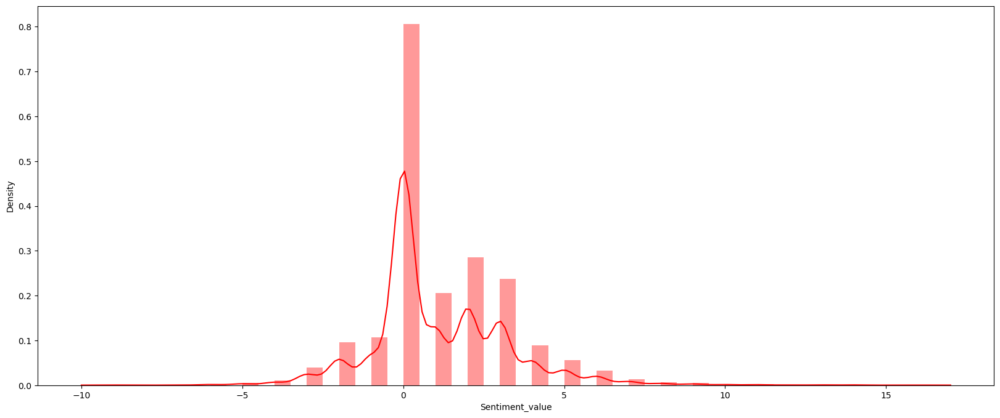

In [62]:
plt.figure(figsize=(20,8))
sns.distplot(sentence_df['Sentiment_value'],color='red')

<AxesSubplot:title={'center':'Sentence sentiment value to sentence word count'}, xlabel='word_count', ylabel='Sentiment_value'>

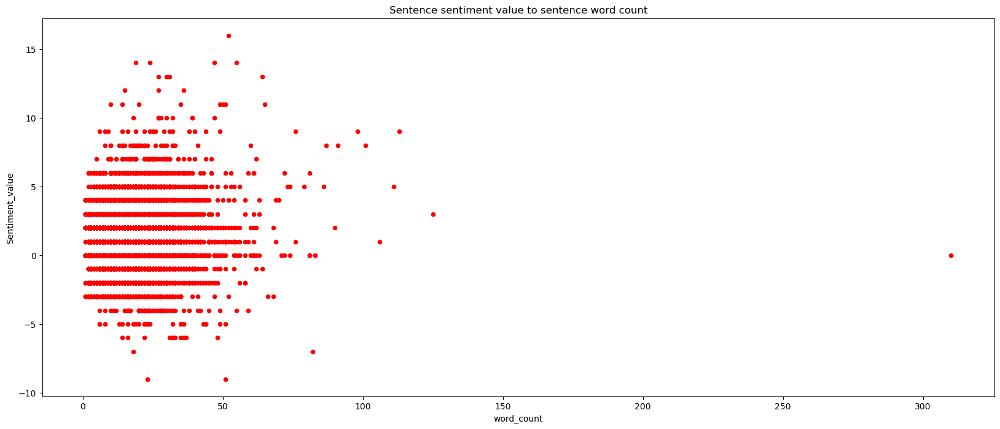

In [63]:
# Correlation analysis
sentence_df.plot.scatter(x='word_count',y='Sentiment_value',title='Sentence sentiment value to sentence word count',figsize=(20,8),color='red')

<AxesSubplot:xlabel='index', ylabel='Sentiment_value'>

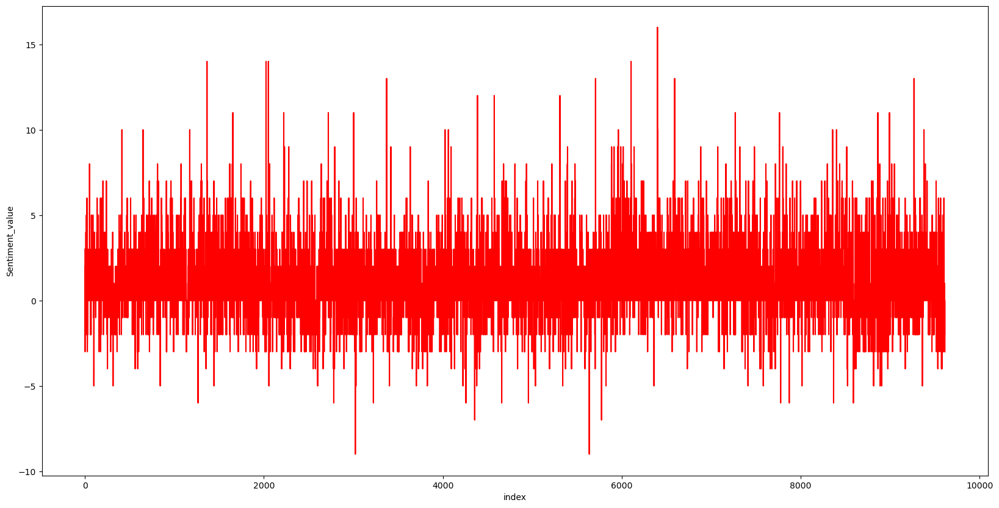

In [64]:
# Plotting the line plot for sentiment value of whole review
plt.figure(figsize=(20,10))
sns.lineplot(y='Sentiment_value',x='index',data=sentence_df,color='red')